In [26]:
#importing necessary libraries


import tensorflow as tf    #importing tensroflow
from tensorflow import keras     #importing keras
from tensorflow.keras.layers import Dense, Input, InputLayer, Flatten
from tensorflow.keras.models import Sequential, Model

from  matplotlib import pyplot as plt  #importing matplotlib.pyplot
import matplotlib.image as mpimg
%matplotlib inline

import numpy as np  # importing numpy
import os   #improrting os

import cv2    #importing open cv

import random  #importing random

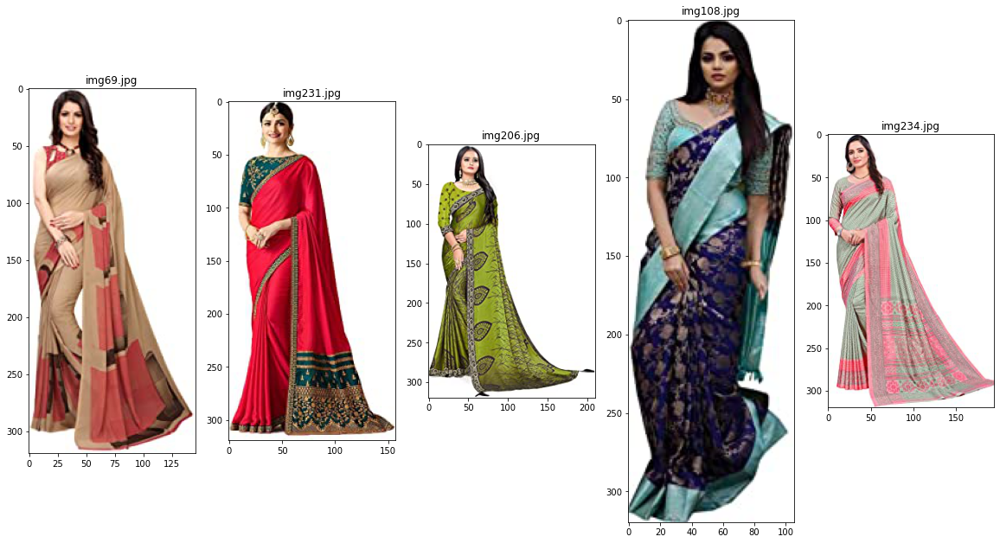

In [27]:
#Randomly displaying the pictures from our file of saree from train folder

plt.figure(figsize=(20,20))
train_folder=r"C:/Users/Priyanka/Downloads/amazon_images/train/saree"
for i in range(5):
    file = random.choice(os.listdir(train_folder))
    image_path= os.path.join(train_folder, file)
    img=mpimg.imread(image_path)
    ax=plt.subplot(1,5,i+1)
    ax.title.set_text(file)
    plt.imshow(img)

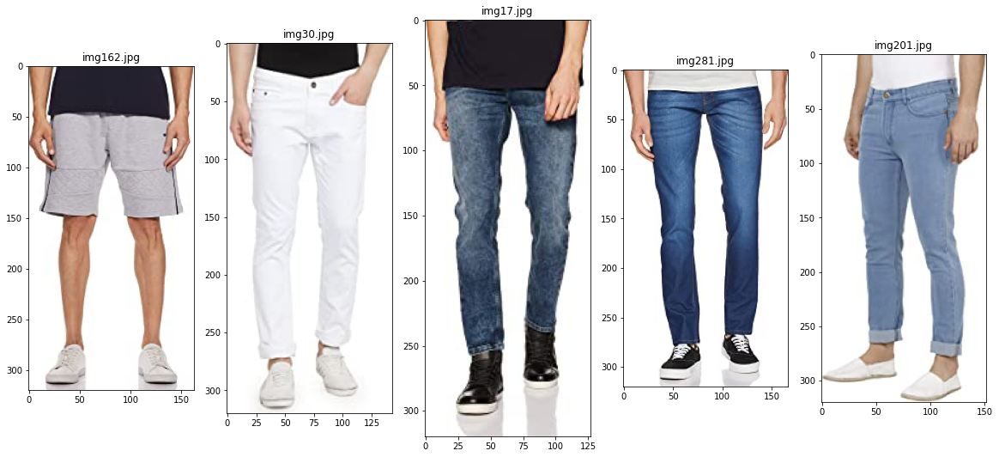

In [28]:
#Randomly displaying the pictures from our file of jeans from train folder

plt.figure(figsize=(20,20))
train_folder=r"C:/Users/Priyanka/Downloads/amazon_images/train/jeans"
for i in range(5):
    file = random.choice(os.listdir(train_folder))
    image_path= os.path.join(train_folder, file)
    img=mpimg.imread(image_path)
    ax=plt.subplot(1,5,i+1)
    ax.title.set_text(file)
    plt.imshow(img)

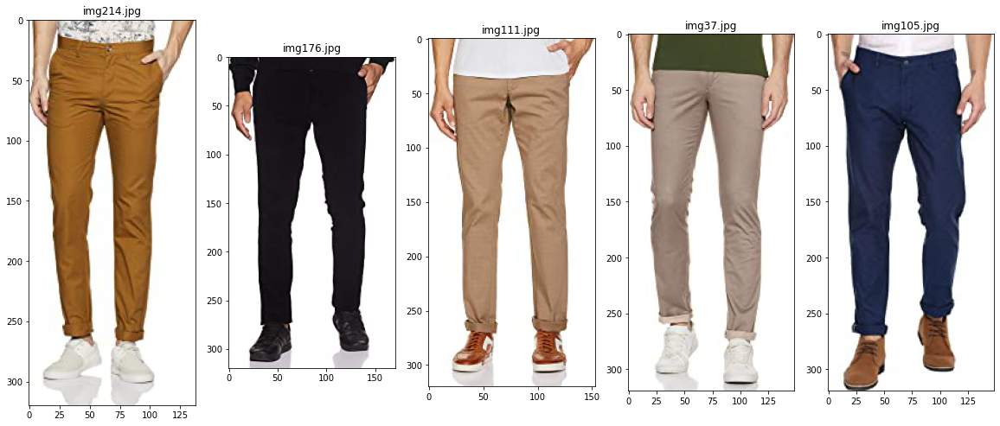

In [29]:
#Randomly displaying the pictures from our file of trouser from train folder

plt.figure(figsize=(20,20))
train_folder=r"C:/Users/Priyanka/Downloads/amazon_images/train/trouser"
for i in range(5):
    file = random.choice(os.listdir(train_folder))
    image_path= os.path.join(train_folder, file)
    img=mpimg.imread(image_path)
    ax=plt.subplot(1,5,i+1)
    ax.title.set_text(file)
    plt.imshow(img)

# Loading train dataset

In [30]:
#changing the width and height of images and loading the train dataset

IMG_WIDTH=200
IMG_HEIGHT=200
img_folder=r"C:/Users/Priyanka/Downloads/amazon_images/train/"

In [31]:
#defining a function to load dataset which will return image data in array form and class name.

def create_dataset(img_folder):
   
    img_data_array=[]   #empty list to store image data 
    class_name=[]    #emoty list to store class name
   
    for dir1 in os.listdir(img_folder):
        for file in os.listdir(os.path.join(img_folder, dir1)):
       
            image_path= os.path.join(img_folder, dir1,  file)
            image= cv2.imread( image_path, cv2.COLOR_BGR2RGB)
            image=cv2.resize(image, (IMG_HEIGHT, IMG_WIDTH),interpolation = cv2.INTER_AREA)
            image=np.array(image)
            image = image.astype('float32')
            image /= 255 
            img_data_array.append(image)
            class_name.append(dir1)
    return img_data_array, class_name
# extracting the image array and class name
img_data, class_name =create_dataset(r"C:/Users/Priyanka/Downloads/amazon_images/train/")

In [32]:
#creating a dictionary with label and respective numerical association

target_dict={k: v for v, k in enumerate(np.unique(class_name))}
target_dict

{'jeans': 0, 'saree': 1, 'trouser': 2}

In [33]:
#setting the numerical value of each label

target_val=  [target_dict[class_name[i]] for i in range(len(class_name))]

In [34]:
len(target_val)

877

In [35]:
# creating x_train and y_train
x_train=np.array(img_data, np.float32)
y_train=np.array(list(map(int,target_val)), np.float32)

# Loading test dataset

In [36]:
#loading the image of test data

IMG_WIDTH=200
IMG_HEIGHT=200
img_folder=r"C:/Users/Priyanka/Downloads/amazon_images/test/"

In [37]:
#defining a function to load the images

def create_dataset(img_folder):
   
    img_data_array=[]
    class_name=[]
   
    for dir1 in os.listdir(img_folder):
        for file in os.listdir(os.path.join(img_folder, dir1)):
       
            image_path= os.path.join(img_folder, dir1,  file)
            image= cv2.imread( image_path, cv2.COLOR_BGR2RGB)
            image=cv2.resize(image, (IMG_HEIGHT, IMG_WIDTH),interpolation = cv2.INTER_AREA)
            image=np.array(image)
            image = image.astype('float32')
            image /= 255 
            img_data_array.append(image)
            class_name.append(dir1)
    return img_data_array, class_name
# extract the image array and class name
img_data_test, class_name_test =create_dataset(r"C:/Users/Priyanka/Downloads/amazon_images/test/")

In [38]:
#creating a dictionary to store each label with an associated numerical representation

pred_dict={k: v for v, k in enumerate(np.unique(class_name_test))}
pred_dict

{'jeans': 0, 'saree': 1, 'trouser': 2}

In [39]:
#creating the label column

pred_val=  [pred_dict[class_name_test[i]] for i in range(len(class_name_test))]

In [40]:
len(pred_val)

221

In [41]:
#creating testing data

x_test=np.array(img_data_test,np.float32)
y_test=np.array(list(map(int,pred_val)),np.float32)

# Convolutional model building

In [42]:
cnn=tf.keras.Sequential([tf.keras.layers.InputLayer(input_shape=(IMG_HEIGHT,IMG_WIDTH, 3)),
                         tf.keras.layers.Conv2D(filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
                         tf.keras.layers.MaxPool2D(2,2),
                         tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
                         tf.keras.layers.MaxPool2D(2,2),
                         tf.keras.layers.Flatten(),
                         tf.keras.layers.Dense(64,activation='relu'),
                         tf.keras.layers.Dense(3, activation='softmax')])
cnn.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [43]:
#fitting the training data

cnn.fit(x_train, y_train, epochs=25)

Epoch 1/25
28/28 [==============================] - 3s 94ms/step - loss: 0.7686 - accuracy: 0.5827
Epoch 2/25
28/28 [==============================] - 3s 96ms/step - loss: 0.5121 - accuracy: 0.7104
Epoch 3/25
28/28 [==============================] - 3s 96ms/step - loss: 0.3660 - accuracy: 0.8540
Epoch 4/25
28/28 [==============================] - 3s 96ms/step - loss: 0.3348 - accuracy: 0.8438
Epoch 5/25
28/28 [==============================] - 3s 96ms/step - loss: 0.3085 - accuracy: 0.8712
Epoch 6/25
28/28 [==============================] - 3s 97ms/step - loss: 0.2711 - accuracy: 0.8871
Epoch 7/25
28/28 [==============================] - 3s 96ms/step - loss: 0.2248 - accuracy: 0.9054
Epoch 8/25
28/28 [==============================] - 3s 96ms/step - loss: 0.1980 - accuracy: 0.9247
Epoch 9/25
28/28 [==============================] - 3s 97ms/step - loss: 0.1677 - accuracy: 0.9304
Epoch 10/25
28/28 [==============================] - 3s 93ms/step - loss: 0.1751 - accuracy: 0.9304
Epoch 11/

In [44]:
#evaluating the model

cnn.evaluate(x_test,y_test)

7/7 [==============================] - 0s 27ms/step - loss: 0.2112 - accuracy: 0.9367


[0.21120589971542358, 0.9366515874862671]

In [45]:
#predicting the output label for test data

y_pred=cnn.predict(x_test)

In [46]:
#displaying first five predictions

y_pred[:5]

array([[6.8443668e-01, 2.4977615e-07, 3.1556305e-01],
       [5.2379489e-01, 5.2998044e-12, 4.7620511e-01],
       [9.9977106e-01, 2.0983339e-12, 2.2890595e-04],
       [9.9980539e-01, 7.0145140e-10, 1.9461283e-04],
       [9.9696285e-01, 2.0464207e-10, 3.0370930e-03]], dtype=float32)

In [47]:
#returning the index of maximum value along an axis using np.argmax

y_classes = [np.argmax(element) for element in y_pred]
y_classes[:5]

[0, 0, 0, 0, 0]

In [48]:
#checking the actual values of the label

y_test[:5]

array([0., 0., 0., 0., 0.], dtype=float32)

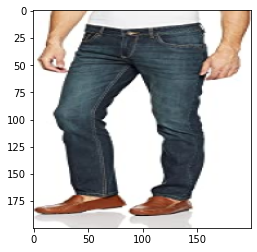

Trouser Men


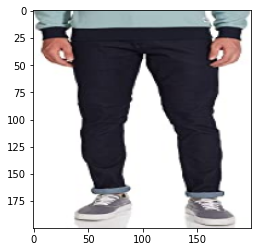

Trouser Men


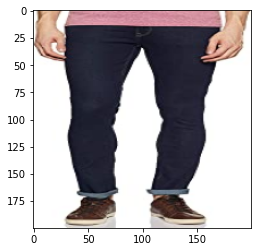

Jeans Men


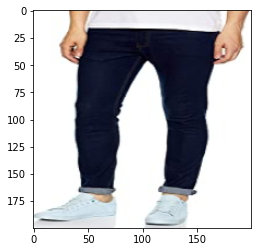

Jeans Men


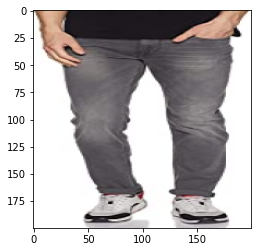

Jeans Men


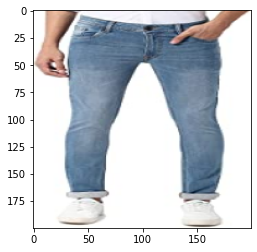

Jeans Men


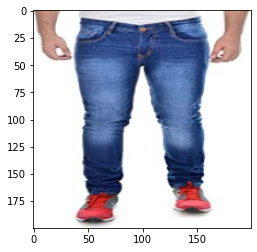

Jeans Men


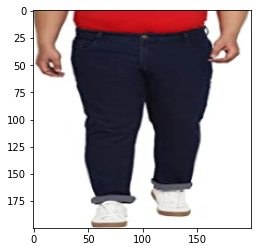

Jeans Men


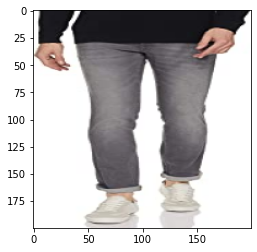

Jeans Men


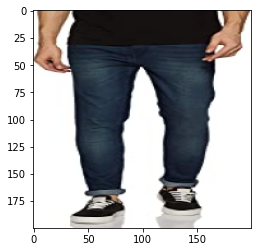

Jeans Men


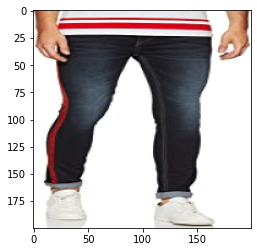

Jeans Men


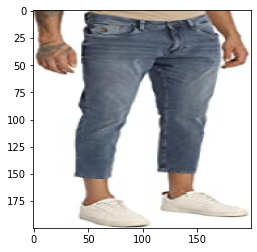

Jeans Men


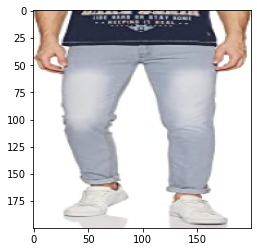

Jeans Men


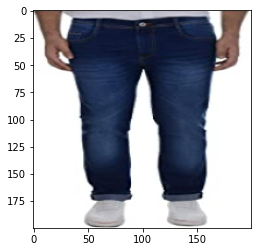

Trouser Men


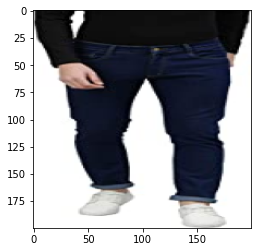

Trouser Men


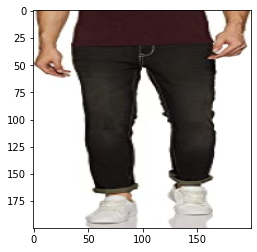

Jeans Men


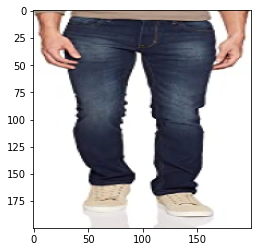

Jeans Men


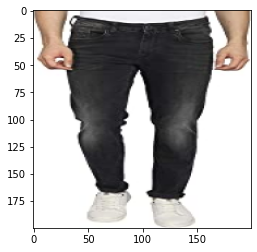

Jeans Men


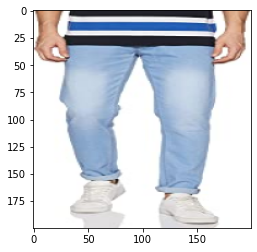

Jeans Men


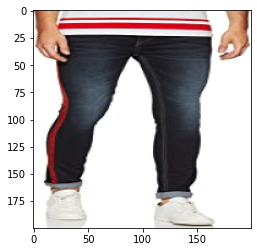

Jeans Men


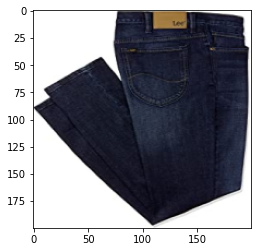

Jeans Men


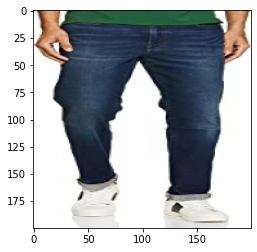

Jeans Men


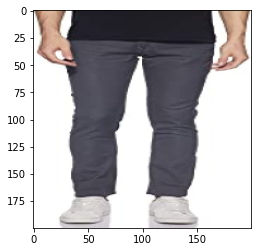

Jeans Men


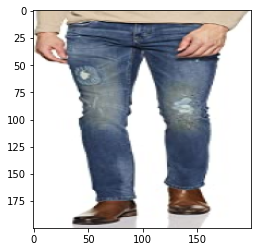

Jeans Men


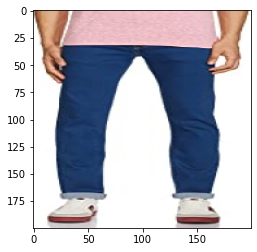

Jeans Men


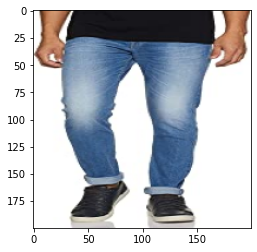

Jeans Men


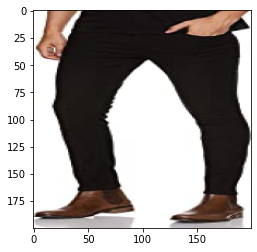

Jeans Men


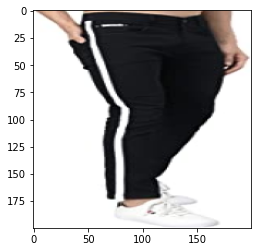

Jeans Men


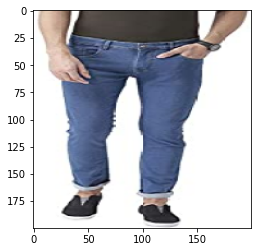

Jeans Men


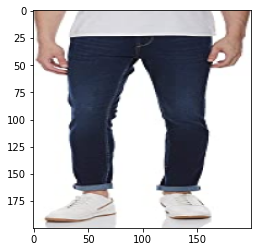

Jeans Men


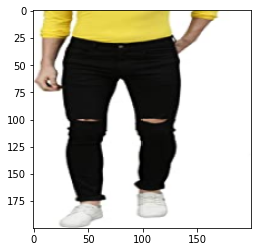

Jeans Men


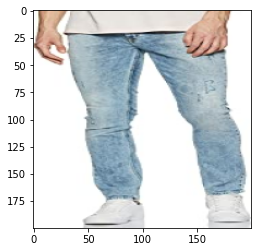

Jeans Men


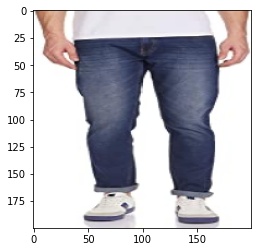

Jeans Men


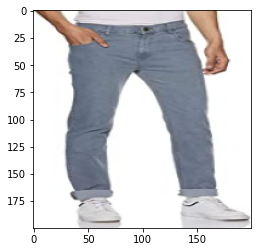

Jeans Men


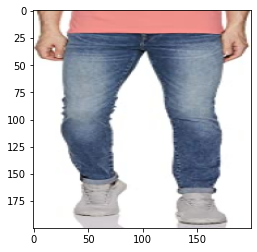

Jeans Men


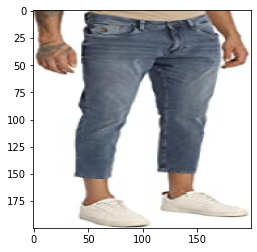

Jeans Men


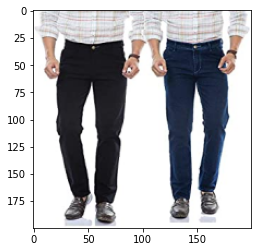

Trouser Men


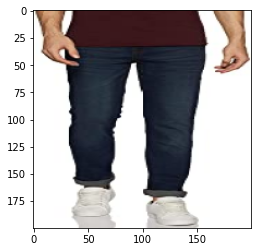

Jeans Men


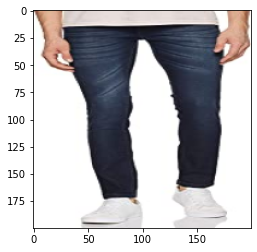

Jeans Men


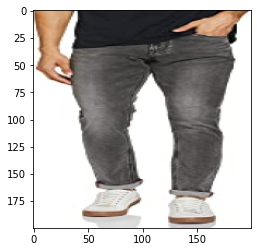

Jeans Men


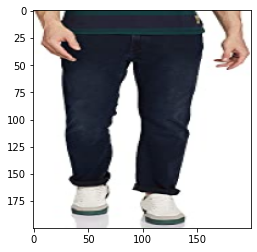

Trouser Men


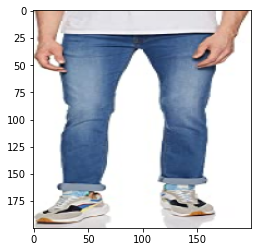

Jeans Men


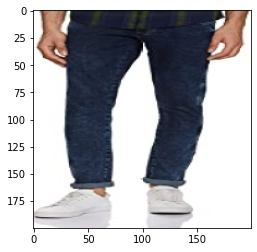

Trouser Men


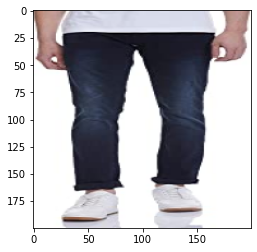

Jeans Men


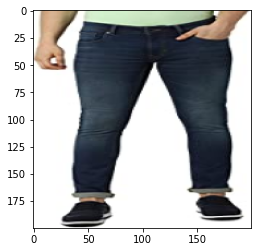

Trouser Men


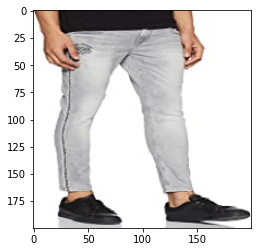

Jeans Men


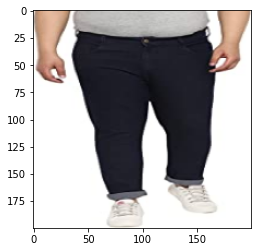

Trouser Men


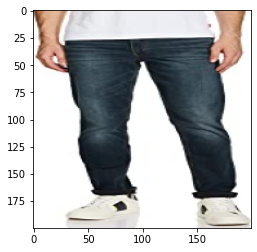

Jeans Men


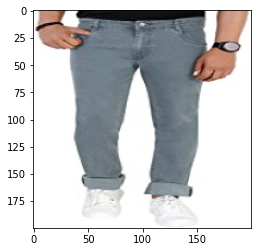

Jeans Men


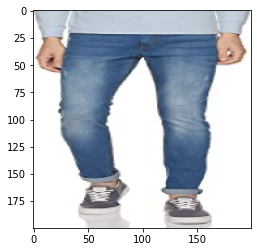

Jeans Men


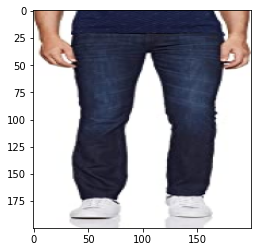

Jeans Men


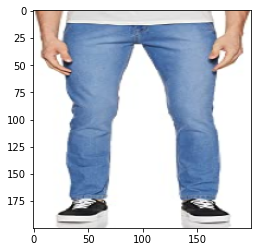

Jeans Men


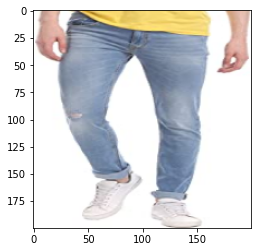

Jeans Men


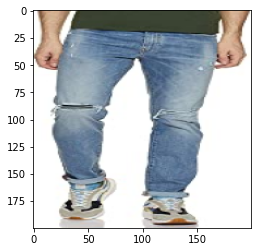

Jeans Men


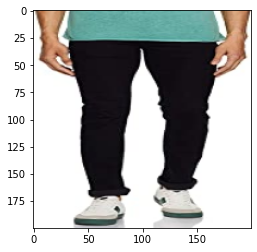

Jeans Men


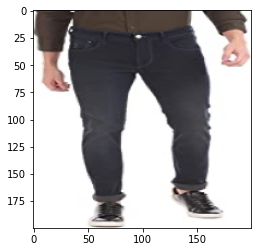

Trouser Men


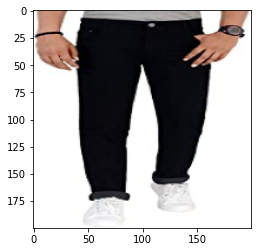

Jeans Men


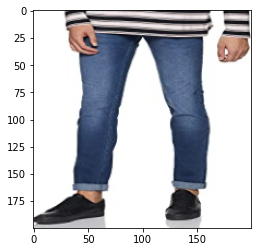

Jeans Men


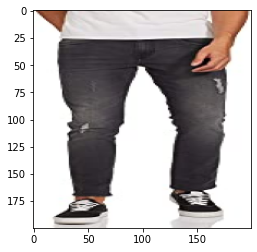

Trouser Men


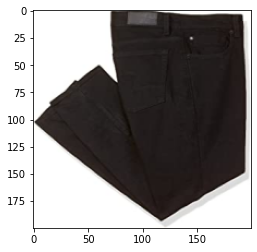

Jeans Men


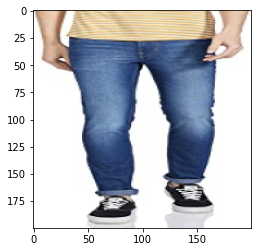

Jeans Men


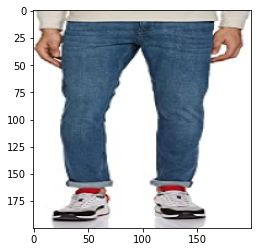

Jeans Men


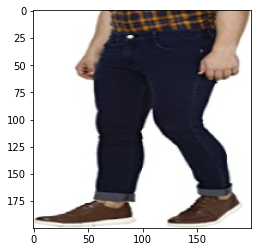

Jeans Men


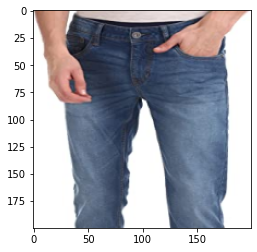

Trouser Men


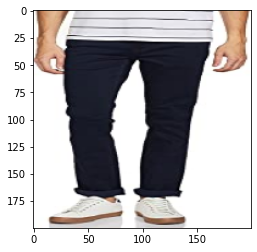

Jeans Men


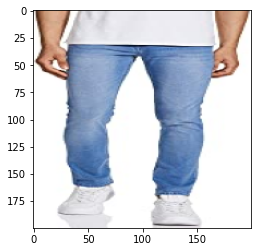

Jeans Men


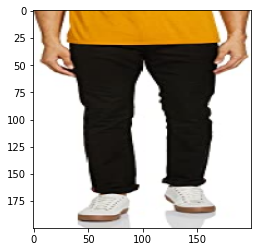

Jeans Men


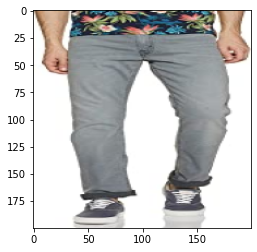

Trouser Men


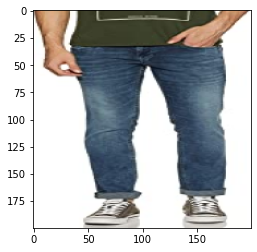

Jeans Men


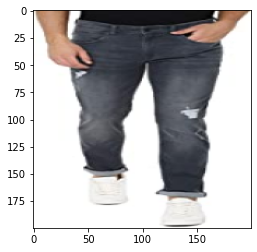

Jeans Men


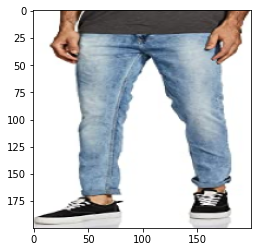

Jeans Men


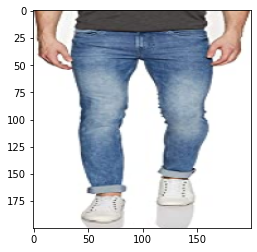

Jeans Men


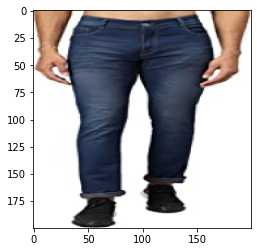

Jeans Men


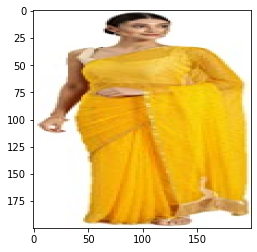

Saree


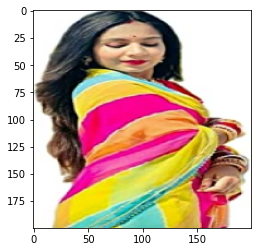

Saree


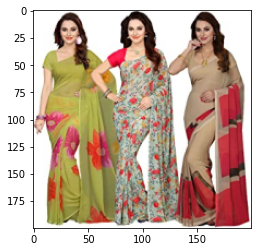

Saree


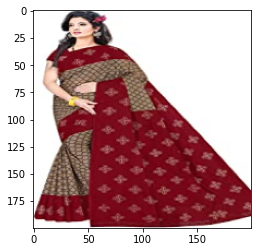

Saree


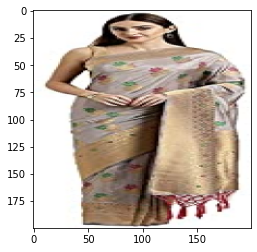

Saree


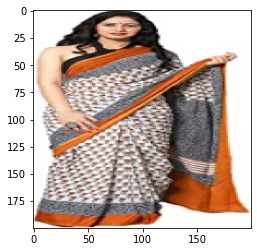

Saree


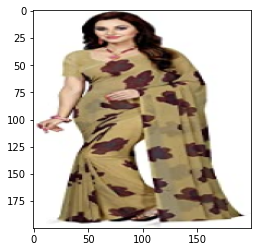

Saree


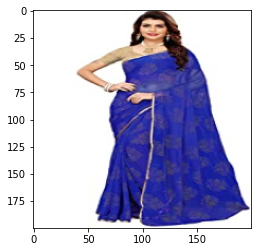

Saree


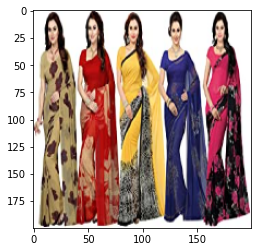

Saree


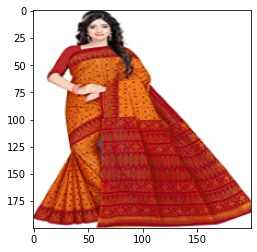

Saree


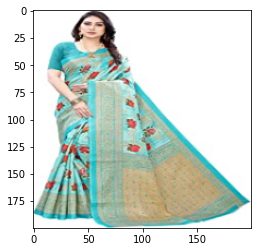

Saree


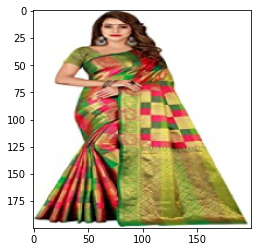

Saree


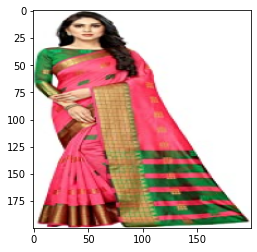

Saree


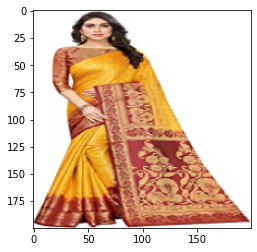

Saree


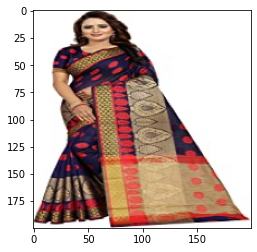

Saree


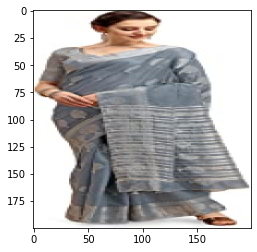

Saree


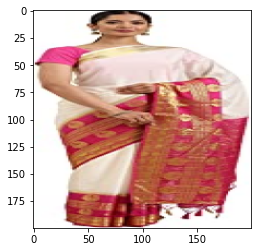

Saree


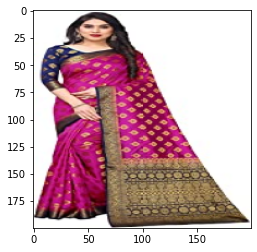

Saree


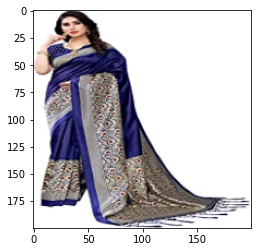

Saree


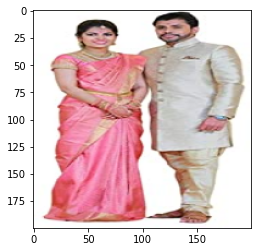

Saree


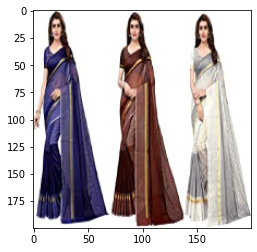

Saree


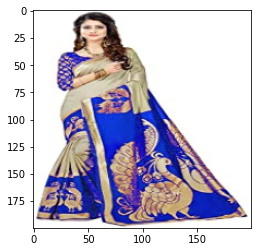

Saree


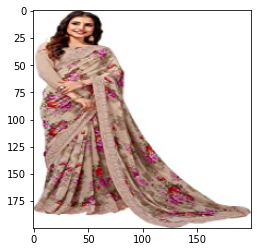

Saree


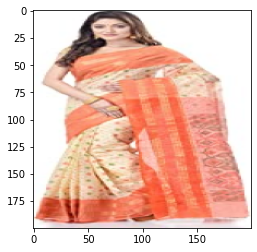

Saree


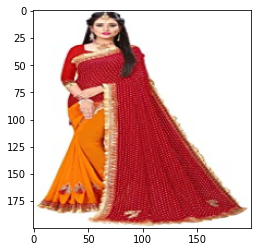

Saree


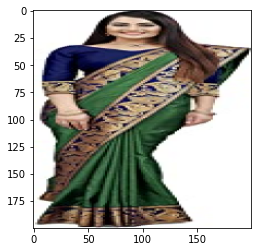

Saree


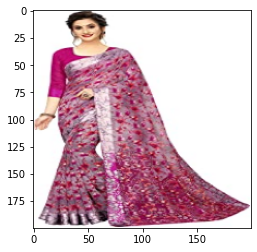

Saree


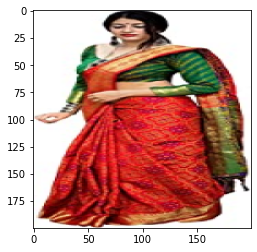

Saree


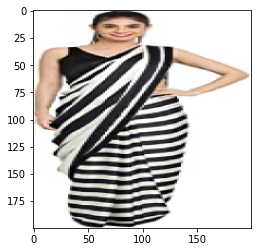

Saree


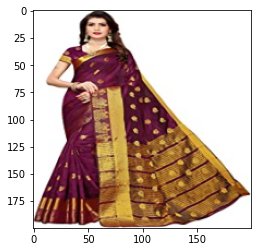

Saree


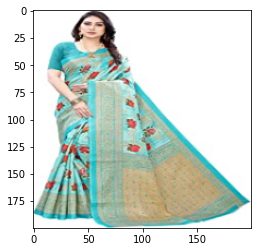

Saree


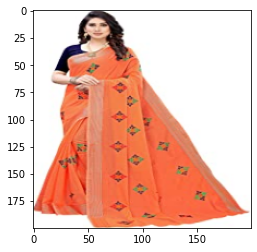

Saree


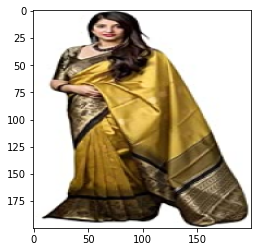

Saree


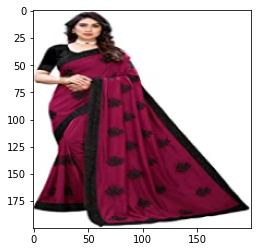

Saree


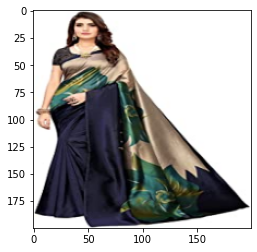

Saree


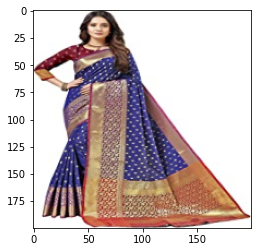

Saree


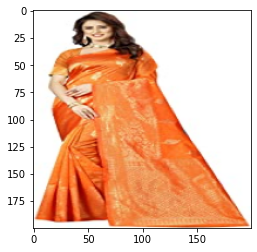

Saree


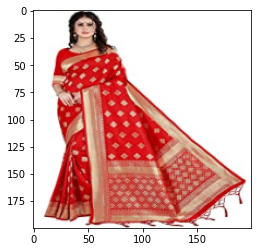

Saree


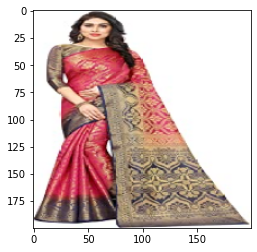

Saree


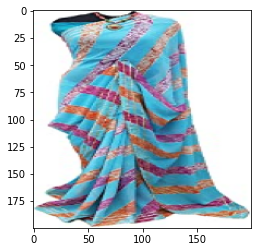

Saree


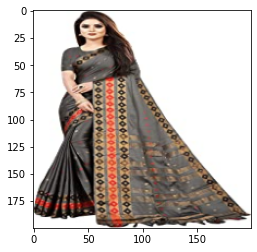

Saree


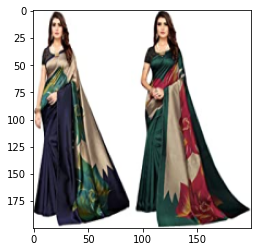

Saree


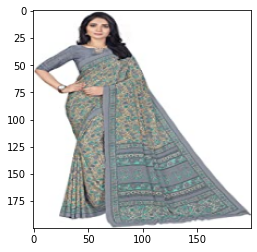

Saree


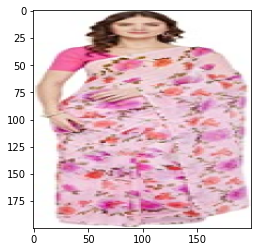

Saree


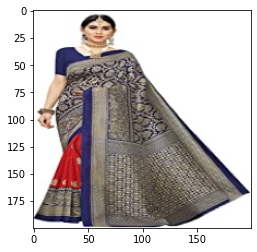

Saree


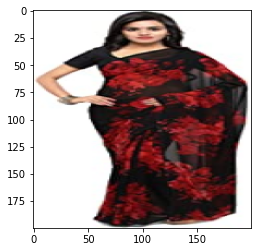

Saree


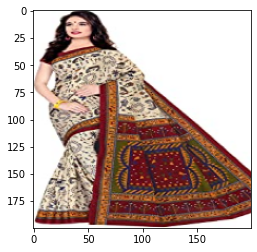

Saree


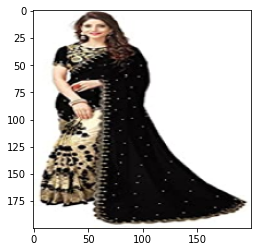

Saree


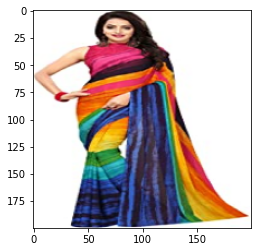

Saree


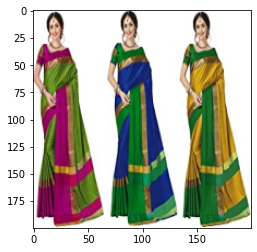

Saree


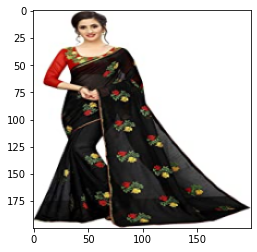

Saree


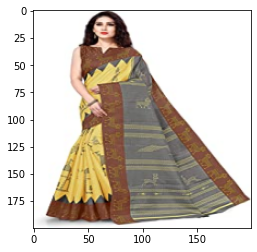

Saree


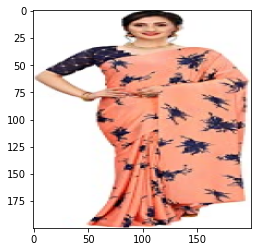

Saree


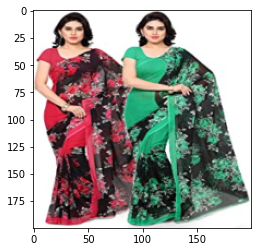

Saree


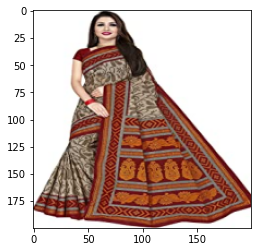

Saree


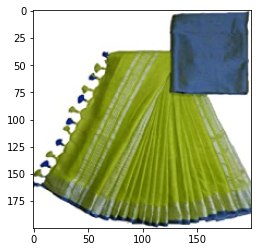

Saree


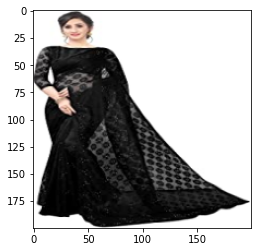

Saree


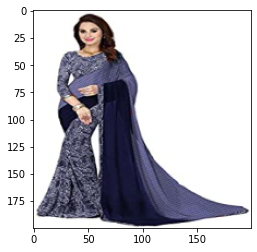

Saree


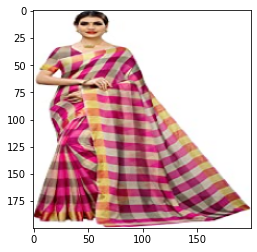

Saree


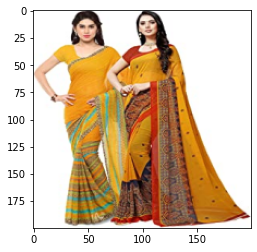

Saree


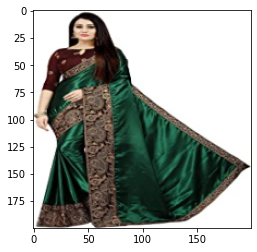

Saree


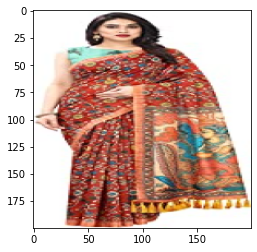

Saree


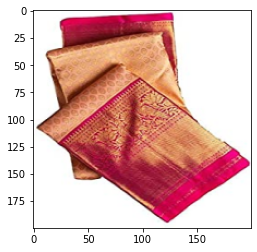

Saree


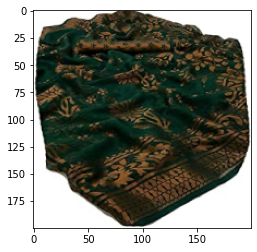

Saree


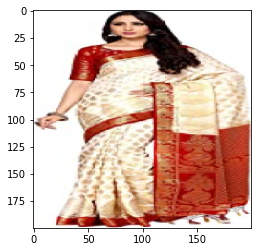

Saree


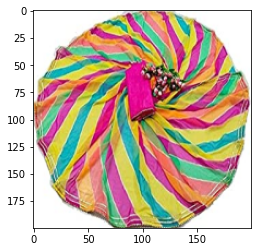

Saree


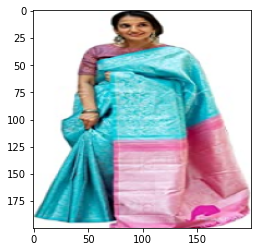

Saree


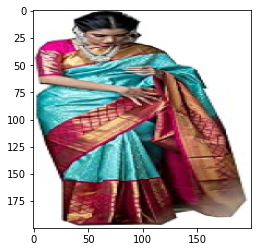

Saree


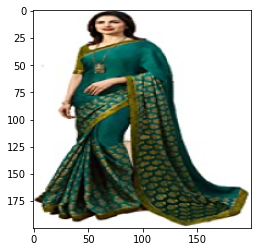

Saree


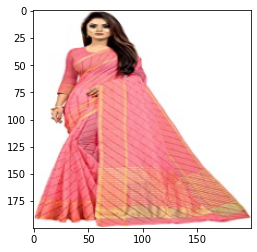

Saree


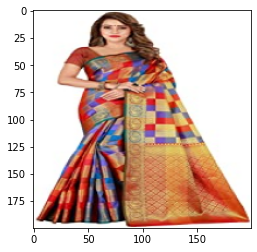

Saree


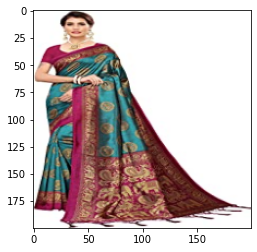

Saree


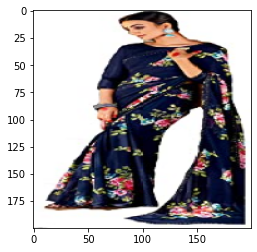

Saree


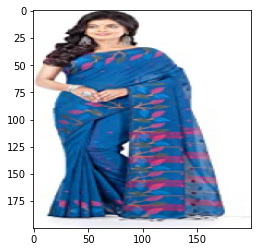

Saree


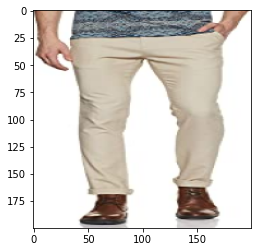

Trouser Men


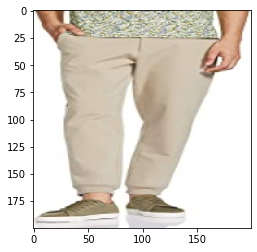

Trouser Men


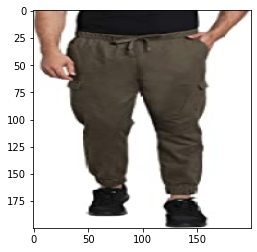

Trouser Men


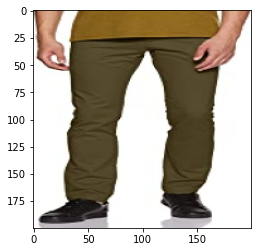

Trouser Men


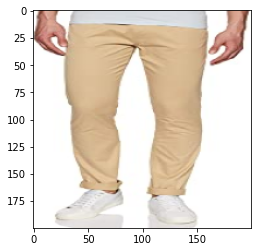

Trouser Men


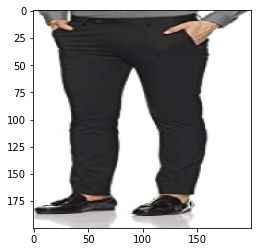

Trouser Men


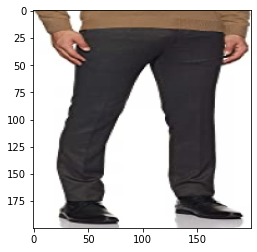

Trouser Men


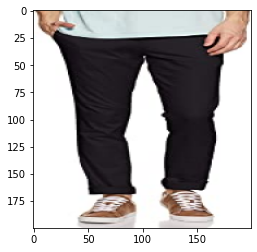

Trouser Men


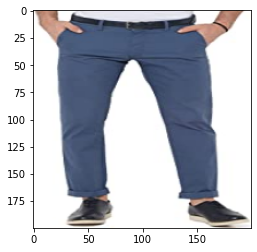

Trouser Men


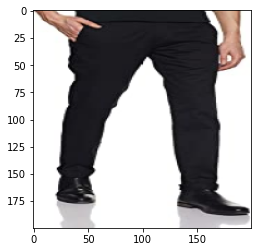

Trouser Men


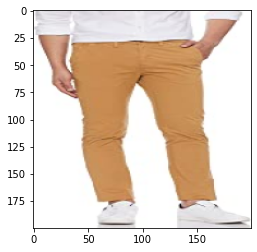

Trouser Men


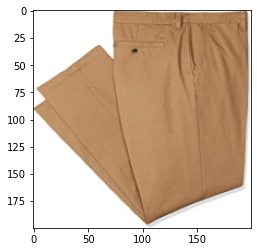

Trouser Men


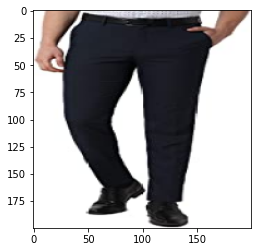

Trouser Men


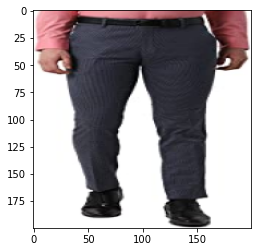

Trouser Men


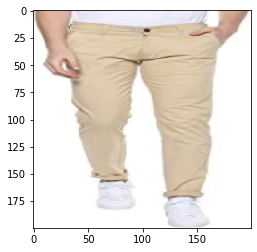

Trouser Men


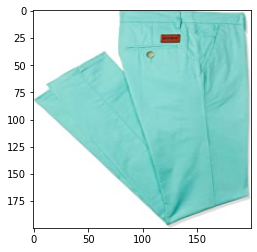

Trouser Men


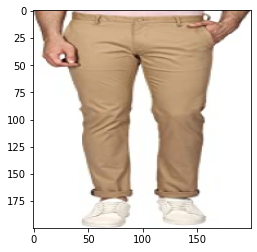

Trouser Men


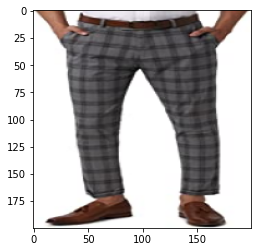

Trouser Men


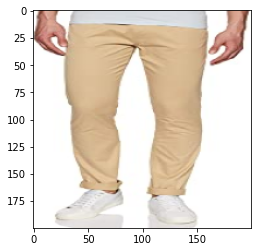

Trouser Men


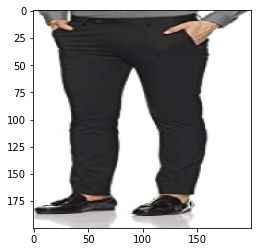

Trouser Men


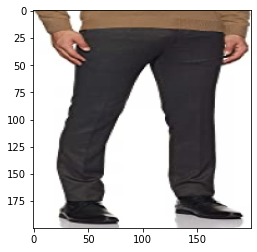

Trouser Men


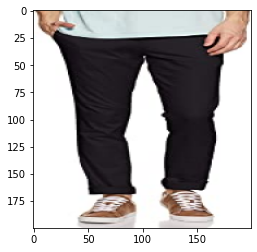

Trouser Men


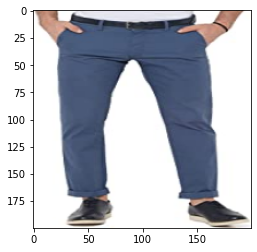

Trouser Men


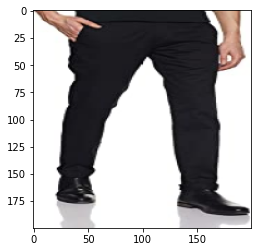

Trouser Men


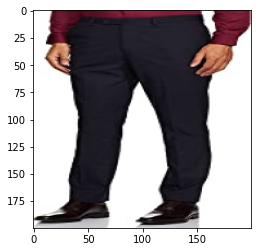

Trouser Men


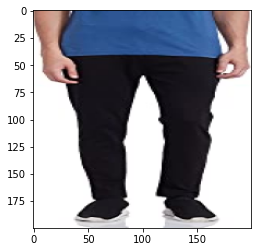

Trouser Men


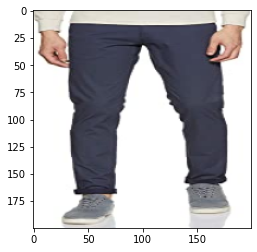

Jeans Men


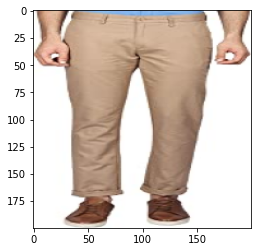

Trouser Men


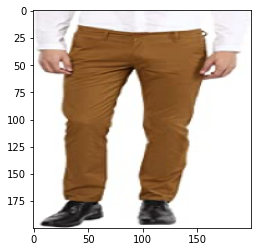

Trouser Men


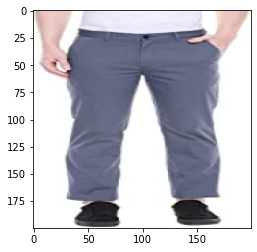

Trouser Men


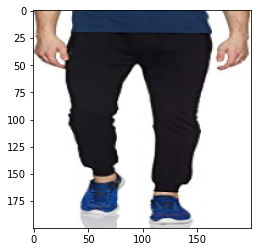

Trouser Men


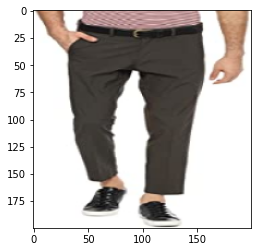

Trouser Men


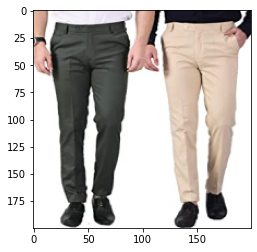

Trouser Men


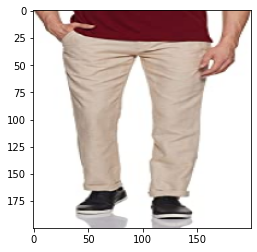

Trouser Men


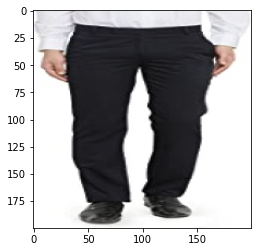

Trouser Men


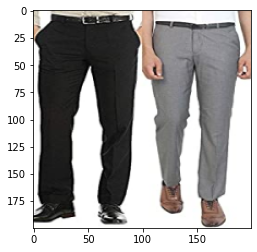

Trouser Men


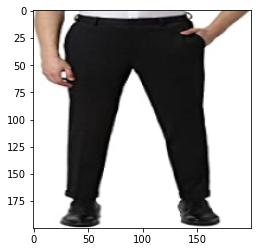

Trouser Men


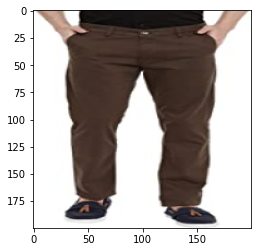

Trouser Men


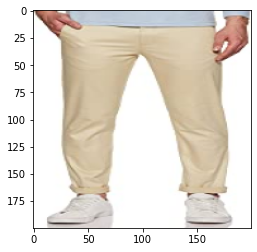

Trouser Men


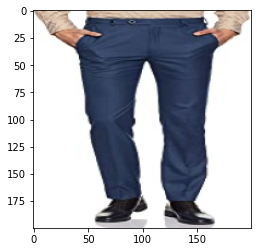

Trouser Men


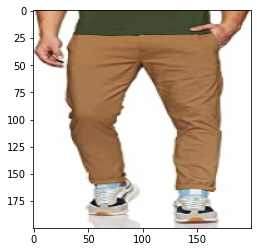

Trouser Men


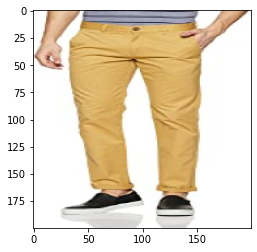

Trouser Men


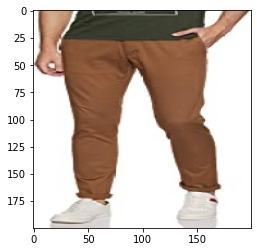

Trouser Men


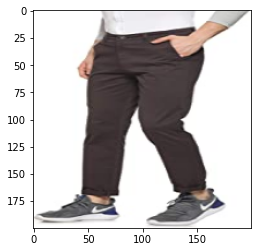

Jeans Men


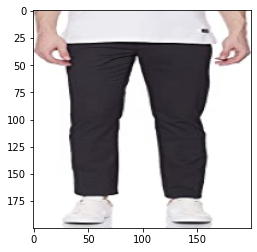

Trouser Men


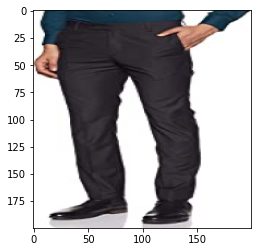

Trouser Men


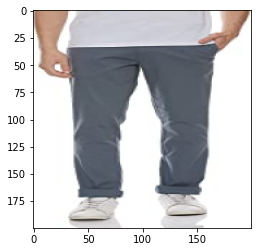

Trouser Men


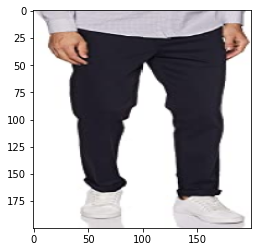

Jeans Men


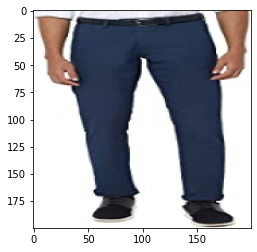

Trouser Men


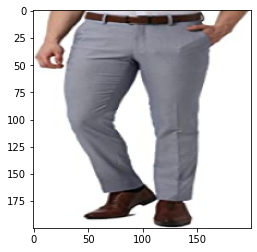

Trouser Men


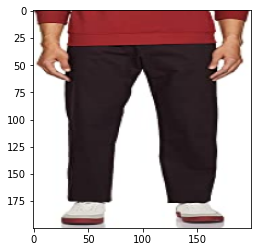

Trouser Men


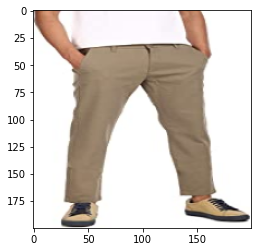

Trouser Men


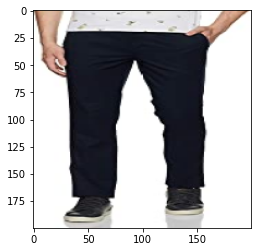

Trouser Men


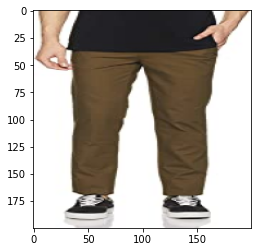

Trouser Men


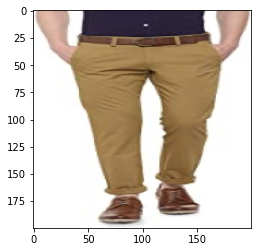

Trouser Men


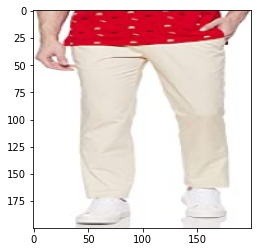

Trouser Men


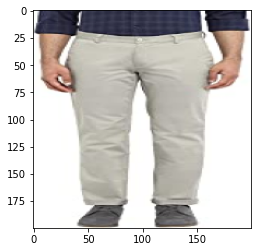

Trouser Men


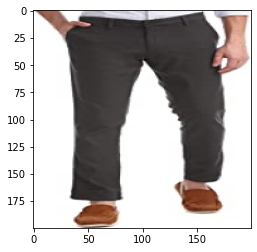

Trouser Men


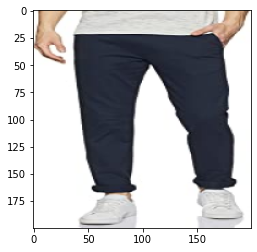

Jeans Men


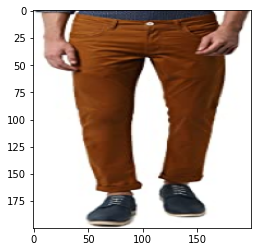

Trouser Men


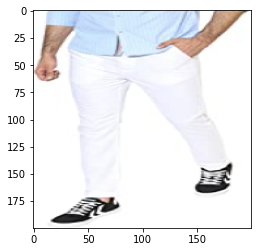

Trouser Men


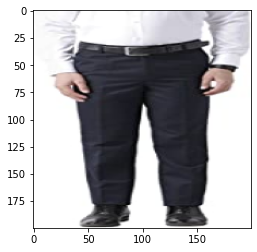

Trouser Men


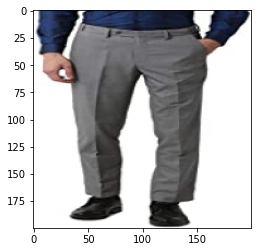

Trouser Men


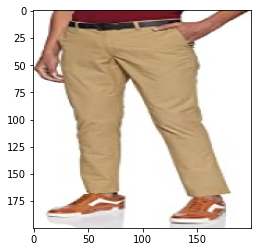

Trouser Men


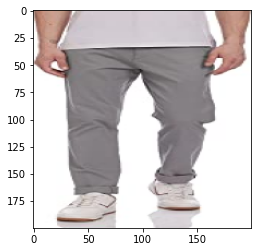

Trouser Men


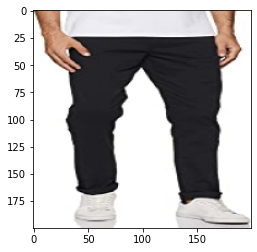

Jeans Men


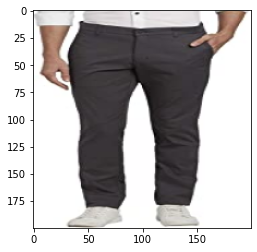

Trouser Men


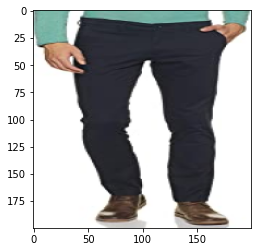

Trouser Men


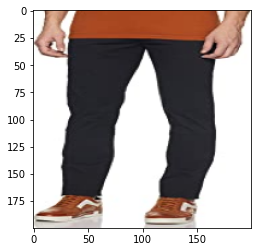

Trouser Men


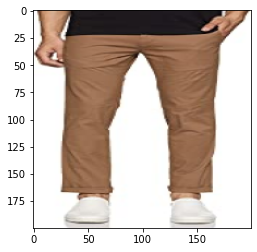

Trouser Men


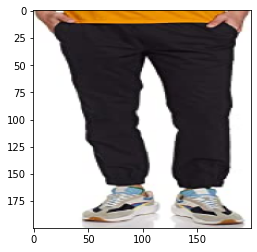

Jeans Men


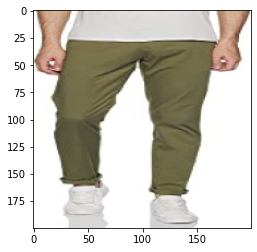

Trouser Men


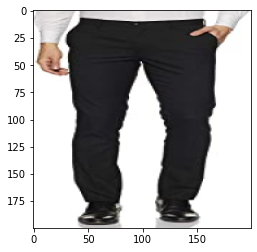

Trouser Men


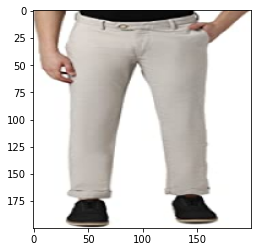

Trouser Men


In [50]:
#displaying each image from the test dataset and making model predict its class.

dir_path=r"C:/Users/Priyanka/Downloads/amazon_images/test/"
for i in os.listdir(dir_path):
    for file in os.listdir(os.path.join(dir_path,i)):
        img_path=os.path.join(dir_path,i,file)
        image=cv2.imread(img_path)
        image=cv2.resize(image, (IMG_HEIGHT, IMG_WIDTH),interpolation = cv2.INTER_AREA)
        plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
        plt.show()
        
        x=tf.keras.preprocessing.image.img_to_array(image)
        x=np.expand_dims(x,axis=0)
        images=np.vstack([x])
        predicted_value=cnn.predict(images)
        pred =np.argmax(predicted_value)
        
        if pred==0:
            print('Jeans Men')
        elif pred==1:
            print('Saree')
        else:
            print('Trouser Men')
            

In [56]:
#evaluating the performance of the model with some error metrics

from sklearn.metrics import confusion_matrix , classification_report, accuracy_score, f1_score
print('Accuracy Score:\n', accuracy_score(y_classes, y_test))
print('\nF1 score: \n', f1_score(y_classes,y_test,average='weighted'))
print("\nClassification Report: \n", classification_report(y_classes, y_test))
print('\n\n')
print('Confusion matrix:\n',confusion_matrix(y_classes,y_test))
print('\n')

Accuracy Score:
 0.9366515837104072

F1 score: 
 0.9367396328435006

Classification Report: 
               precision    recall  f1-score   support

           0       0.95      0.87      0.91        79
           1       1.00      1.00      1.00        74
           2       0.86      0.94      0.90        68

    accuracy                           0.94       221
   macro avg       0.94      0.94      0.94       221
weighted avg       0.94      0.94      0.94       221




Confusion matrix:
 [[69  0 10]
 [ 0 74  0]
 [ 4  0 64]]


